In [25]:
# %pip install tensorflow tqdm pillow matplotlib ipykernel scikit-learn 

<a target="_blank" href="https://colab.research.google.com/github/naddeoa/yt-data/blob/master/thumbnails.ipynb">
  <img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/>
</a>

# Set up the model

In [26]:
import logging
from sklearn.decomposition import PCA
import os

# Quiet a few noisy logs
os.environ['TF_CPP_MIN_LOG_LEVEL'] = '2'
import tensorflow as tf
# logging.disable(logging.CRITICAL)
tf.get_logger().setLevel('WARNING')

from tensorflow import keras
from tensorflow.keras import layers
from tqdm.auto import tqdm
import matplotlib.pyplot as plt
import PIL
from typing import List, Dict, Union, Tuple, Optional
import PIL.Image
# from multiprocess import Pool
from sklearn.decomposition import PCA
import numpy as np
from functools import partial
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Reshape, Conv2DTranspose, Flatten, LeakyReLU, Concatenate, GaussianNoise, Dropout
from PIL import Image
import imagehash
import numpy as np

print("Num GPUs Available: ", len(tf.config.list_physical_devices('GPU')))




Num GPUs Available:  1


In [27]:

def is_notebook():
    try:
        # Check if the 'get_ipython' function exists
        shell = get_ipython().__class__.__name__
        if shell == 'ZMQInteractiveShell':
            return True  # Running in a Jupyter notebook
        else:
            return False  # Running
    except Exception:
        return False


def is_colab():
    try:
        import google.colab
        return True
    except ModuleNotFoundError:
        return False

def create_batches(lst, batch_size, length):
    """Yield successive n-sized batches from lst."""
    for i in range(0, length, batch_size):
        yield lst[i:i + batch_size]

# Hyper parameters

In [28]:
# Hyper parameters
latent_dim = 120
BATCH_SIZE = 32

generator_learning_rate = 0.0002
discriminator_learning_rate = generator_learning_rate * 1.5

# -1 means all outputs are identical
# 0 means they're not the same
# 1 means they have nothing in common
similarity_threshold = 0.0
similarity_penalty = 4


# learning_rate = 0.001 # super high
beta_1=0.9
total_epochs_so_far = 0


In [29]:
# fancy generator


def build_generator(latent_dim):
    generator = Sequential(name='Generator')

    generator.add(Dense(128, input_dim=latent_dim))
    generator.add(LeakyReLU(alpha=0.2))

    generator.add(Dense(8*8*256, activation='relu'))
    generator.add(Dropout(0.05)) 

    generator.add(Reshape((8, 8, 256)))

    generator.add(Conv2DTranspose(256, (3, 3), strides=(2, 2), padding='same', activation='relu'))

    generator.add(Conv2DTranspose(128, (3, 3), strides=(1, 1), padding='same', activation='relu'))

    generator.add(Conv2DTranspose(64, (3, 3), strides=(2, 2), padding='same', activation='relu'))

    generator.add(Conv2DTranspose(3, (3, 3), strides=(2, 2), padding='same', activation='tanh'))

    generator.summary()
    return generator

# def build_generator(latent_dim):
#     generator = Sequential(name='Generator')

#     generator.add(Dense(256, input_dim=latent_dim))
#     generator.add(LeakyReLU(alpha=0.2))
#     # generator.add(GaussianNoise(0.2)) 

#     generator.add(Dense(512))
#     generator.add(LeakyReLU(alpha=0.2))
#     # generator.add(GaussianNoise(0.2)) 

#     generator.add(Dense(1000, activation='relu'))
#     generator.add(Dropout(0.05)) 

#     generator.add(Dense(8 * 8 * 256, activation='relu'))
#     generator.add(Dropout(0.05)) 

#     generator.add(Reshape((8, 8, 256)))

#     generator.add(Conv2DTranspose(64, (3, 3), strides=(2, 2), padding='same', activation='relu' ))

#     generator.add(Conv2DTranspose(32, (3, 3), strides=(2, 2), padding='same'))
#     generator.add(LeakyReLU(alpha=0.2))

#     generator.add(Conv2DTranspose(3, (3, 3), strides=(2, 2), padding='same', activation='tanh' ))

#     generator.summary()
#     return generator


def build_discriminator():
    discriminator = Sequential(name='Discriminator')
    discriminator.add(layers.Conv2D(32, (3, 3), strides=(2, 2),  input_shape=(64, 64, 3), padding='same', activation='relu' ))
    discriminator.add(layers.Conv2D(64, (3, 3), strides=(2, 2), padding='same', activation='relu' )) 
    discriminator.add(layers.Conv2D(128, (3, 3), strides=(2, 2), padding='same', activation='relu' ))
    discriminator.add(layers.Flatten())
    discriminator.add(layers.Dense(1, activation='sigmoid'))

    discriminator.summary()
    return discriminator


# Combine the generator and discriminator into a GAN
def build_gan(generator, discriminator):
    # discriminator.trainable = False
    model = keras.Sequential([
        generator,
        discriminator
    ])
    return model



# Build one to validate it
build_gan(build_generator(latent_dim), build_discriminator())

Model: "Generator"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_3 (Dense)             (None, 128)               15488     
                                                                 
 leaky_re_lu_1 (LeakyReLU)   (None, 128)               0         
                                                                 
 dense_4 (Dense)             (None, 16384)             2113536   
                                                                 
 dropout_1 (Dropout)         (None, 16384)             0         
                                                                 
 reshape_1 (Reshape)         (None, 8, 8, 256)         0         
                                                                 
 conv2d_transpose_4 (Conv2DT  (None, 16, 16, 256)      590080    
 ranspose)                                                       
                                                         

In [30]:


def visualize_image_distribution(images):
    # Flatten all pixel values into a single list
    all_pixels = np.array(images).flatten()

    # Plot a histogram for the pixel values
    plt.hist(all_pixels, bins=256, color='gray', alpha=0.7)
    plt.title('Pixel Intensity Distribution')
    plt.xlabel('Pixel Intensity')
    plt.ylabel('Frequency')
    plt.show()
    plt.close()

def visualize_image_scatter(images):
    # Flatten each image into a 1D array
    flattened_images = np.array([img.flatten() for img in images])

    # Apply PCA with 2 components
    pca = PCA(2)
    reduced_data = pca.fit_transform(flattened_images)

    # Plot the reduced data as a scatter plot
    plt.scatter(reduced_data[:, 0], reduced_data[:, 1])
    plt.title('PCA Scatter Plot')
    plt.show()
    plt.close()


def compare_scatters(dataset1, dataset2, name1='Dataset 1', name2='Dataset 2'):
    global total_epochs_so_far
    plt.cla()
    plt.clf()
    # Flatten each image into a 1D array
    flattened_images1 = np.array([img.flatten() for img in dataset1])
    flattened_images2 = np.array([img.flatten() for img in dataset2])

    # Apply PCA with 2 components
    pca = PCA(2)

    # Fit PCA on the combined datasets and transform each separately
    pca.fit(np.concatenate((flattened_images1, flattened_images2)))
    reduced_data1 = pca.transform(flattened_images1)
    reduced_data2 = pca.transform(flattened_images2)

    # Plot the reduced data as a scatter plot
    plt.scatter(reduced_data1[:, 0], reduced_data1[:, 1], label=name1, alpha=0.5)
    plt.scatter(reduced_data2[:, 0], reduced_data2[:, 1], label=name2, alpha=0.5)
    plt.title('PCA Scatter Plot')
    plt.legend()
    if is_notebook():
        plt.show()
        plt.close()
    else:
        # Ensure predictions exists
        if not os.path.exists('predictions'):
            os.mkdir('predictions')
        plt.savefig(f'predictions/latest-plot.jpg')
        plt.savefig(f'predictions/plot-{total_epochs_so_far}.jpg')
        plt.close()


def process_prediction_image(image):
    # Scale the image from [-1, 1] to [0, 1]
    image = (image + 1) / 2
    # Clip values to [0, 1] in case of any numerical instability
    image = tf.clip_by_value(image, 0, 1)
    # Convert the image tensor to a NumPy array
    return image.numpy()


def visualize_preprocessed_image(image):
    image = process_prediction_image(image)

    # Display the image
    plt.imshow(image)
    plt.axis('off')
    plt.show()
    plt.close()


def visualize_thumbnails(image_list, rows, cols):
    global total_epochs_so_far
    plt.cla()
    plt.clf()
    # Create a grid of subplots to display the images
    fig, axs = plt.subplots(nrows=rows, ncols=cols, figsize=(10, 10))

    # Make a copy of image_list
    image_list = list(image_list)
    for row in range(rows):
        for col in range(cols):
            image = process_prediction_image(image_list.pop())
            if rows == 1:
                axs[col].imshow(image)
                axs[col].axis('off')
            else:
                axs[row, col].imshow(image)
                axs[row, col].axis('off')

    plt.subplots_adjust(wspace=0.0, hspace=0)
    plt.tight_layout()

    # Show the plot
    if is_notebook():
        plt.show()
        plt.close()
    else:
        # Ensure predictions exists
        if not os.path.exists('predictions'):
            os.mkdir('predictions')
        plt.savefig(f'predictions/latest.jpg')
        plt.savefig(f'predictions/thumbnail-{total_epochs_so_far}.jpg')
        plt.close()

def show_samples(generator, rows=1, cols=10, dataset=None):
    noise = np.random.uniform(-1, 1, size=(rows * cols, latent_dim))
    generated_thumbnails = generator.predict(noise)
    # for it in generated_thumbnails:
        # visualize_preprocessed_image(it)
    visualize_thumbnails(generated_thumbnails, rows, cols)

    if dataset is not None:
        # generated = [generator.predict(tf.random.normal([1, latent_dim])) for i in range(100)]
        compare_scatters(dataset, generated_thumbnails)

In [31]:

# Define the loss functions
def discriminator_loss(real_output, fake_output) -> Tuple[tf.Tensor, Tuple[tf.Tensor, tf.Tensor]]:
    real_loss = tf.reduce_mean(tf.keras.losses.binary_crossentropy(tf.ones_like(real_output), real_output))
    fake_loss = tf.reduce_mean(tf.keras.losses.binary_crossentropy(tf.zeros_like(fake_output), fake_output))
    disc_loss = real_loss + fake_loss
    return disc_loss, (real_loss, fake_loss)


# def generator_loss(fake_output, real_output):
    # return tf.reduce_mean(tf.square(tf.reduce_mean(fake_output, axis=0) - tf.reduce_mean(real_output, axis=0)))

def generator_loss(fake_output):
    gen_loss = tf.keras.losses.BinaryCrossentropy()(tf.ones_like(fake_output), fake_output)
    return gen_loss



In [32]:

# Define the optimizero
generator_optimizer = keras.optimizers.Adam(learning_rate=generator_learning_rate, beta_1=beta_1)
discriminator_optimizer = keras.optimizers.Adam(learning_rate=discriminator_learning_rate, beta_1=beta_1)

if is_colab():
    weight_path = "/content/drive/MyDrive/thumbnail-project/weights"
else:
    weight_path = "./model/weights"
    # Make sure model dir exists
    if not os.path.exists("./model"):
        os.mkdir("./model")

def similarity_penalty_loss(similarity_score):
    return tf.maximum(0.0,  similarity_penalty  * (similarity_threshold - similarity_score))

@tf.function
def worst_cosine_similarity(images):
    '''
    Returns the maximum cosine similarity between any two images in the list. This penalizes
    the generator for generating any two samples that are similar to each other in a batch.

    too slow to actually use in training
    '''
    similarities = [tf.reduce_mean(tf.keras.losses.cosine_similarity(images[i], images[j]))
                    for i in range(len(images)) 
                    for j in range(i+1, len(images))]
    # similarities = [tf.reduce_mean(tf.keras.losses.cosine_similarity(images[i], images[i+1])) for i in range(len(images) - 1)]
    return tf.reduce_min(similarities)

def compute_similarity_score(images1, images2):
    similarity = tf.keras.losses.cosine_similarity(images1, images2)
    return tf.reduce_mean(similarity) 

@tf.function
def train_step(images,  generator, discriminator, epoch, generator_every, discriminator_every):
    noise = np.random.uniform(-1, 1, size=(BATCH_SIZE, latent_dim))
    noise2 = np.random.uniform(-1, 1, size=(BATCH_SIZE, latent_dim))

    similarity_batch_max = 8
    with tf.GradientTape() as gen_tape, tf.GradientTape() as disc_tape:
        generated_images = generator(noise, training=True)
        similarity_batch = generator(noise2, training=True)

        real_output = discriminator(images, training=True)
        fake_output = discriminator(generated_images, training=True)

        gen_loss = generator_loss(fake_output)
        disc_loss, (real_loss, fake_loss) = discriminator_loss(real_output, fake_output)

        # Penalize similarity
        similarity_score = worst_cosine_similarity(similarity_batch[:similarity_batch_max])
        # similarity_score = compute_similarity_score(generated_images, similarity_batch  )
        similarity_penalty = similarity_penalty_loss(similarity_score)
        gen_loss += similarity_penalty

    # Apparently this has to happen after the with context exits. ML people...
    gradients_of_generator = gen_tape.gradient(gen_loss, generator.trainable_variables)
    gradients_of_discriminator = disc_tape.gradient(disc_loss, discriminator.trainable_variables)

    if generator_every > 0 and  epoch % generator_every == 0:
        generator_optimizer.apply_gradients(zip(gradients_of_generator, generator.trainable_variables))
    
    if discriminator_every > 0 and epoch % discriminator_every== 0:
        discriminator_optimizer.apply_gradients(zip(gradients_of_discriminator, discriminator.trainable_variables))
        
    return {
        'disc_loss': disc_loss,
        'gen_loss': gen_loss,
        'real_loss': real_loss,
        'fake_loss': fake_loss,
        'similarity_score': similarity_score,
        'similarity_penalty': similarity_penalty
    }


def load_weights(gan):
    try:
        gan.load_weights(weight_path)
        print("Loaded previous weights")
    except Exception as e:
        print(e)


def trunc(loss):
    '''Truncate loss values for display in tqdm'''
    return f'{loss:.8f}'


class LossTracker:
    def __init__(self):
        self.losses = {
            'disc_loss': [],
            'gen_loss': [],
            'real_loss': [],
            'fake_loss': [],
            'similarity_score': [],
            'similarity_penalty': []
        }

    def update(self, loss_dict):
        for key, value in loss_dict.items():
            self.losses[key].append(value)

    def get_means(self):
        return {key: np.mean(value) for key, value in self.losses.items()}

    def reset(self):
        for key in self.losses.keys():
            self.losses[key] = []


def train(dataset, epochs, gan, generator, discriminator, samples_after=100, discriminator_every=1, generator_every=1):
    global total_epochs_so_far
    # progress_bar_epochs = tqdm(range(epochs), desc='Epochs', position=0)
    load_weights(gan)
    
    # TODO if you make this range(1, epochs) literally everything breaks and I have no idea why
    for epoch in range(epochs):
        total_epochs_so_far = total_epochs_so_far + 1
        
        batched_dataset = tf.data.Dataset.from_tensor_slices(dataset).shuffle(len(dataset)).batch(BATCH_SIZE)
        progress_bar_batches = tqdm(batched_dataset, position=0, leave=False)

        loss_tracker = LossTracker()
        for image_batch in progress_bar_batches:
            # skip loop if there aren't enough images left for a full batch
            if len(image_batch) < BATCH_SIZE:
                continue

            losses = train_step(image_batch, generator, discriminator, generator_every=generator_every, discriminator_every=discriminator_every, epoch=epoch)
            loss_tracker.update(losses)
            disc_loss = losses['disc_loss']
            gen_loss = losses['gen_loss']
            real_loss = losses['real_loss']
            fake_loss = losses['fake_loss']
            similarity_score = losses['similarity_score']
            
            # progress_bar_batches.update(1)
            progress_bar_batches.set_postfix({'Epoch': epoch, 'Similarity': trunc(similarity_score.numpy()), 'Gen Loss': trunc(gen_loss.numpy()), 'Disc loss': trunc(disc_loss.numpy()), ' Disc Real Loss': trunc(real_loss.numpy()), 'Disc Fake Loss': trunc(fake_loss.numpy())})
        
        losses = loss_tracker.get_means()
        similarity_score = trunc(losses['similarity_score'])
        gen_loss = trunc(losses['gen_loss'])
        disc_loss = trunc(losses['disc_loss'])
        real_loss = trunc(losses['real_loss'])
        fake_loss = trunc(losses['fake_loss'])
        print(f'Epoch {epoch} | Similarity: {similarity_score} | Gen Loss: {gen_loss} | Disc Loss: {disc_loss} | Disc Real Loss: {real_loss} | Disc Fake Loss: {fake_loss}')

        if epoch == 1 or (samples_after is not None and epoch % samples_after == 0):
            show_samples(generator, dataset=dataset)

        gan.save_weights(weight_path)



# Download the dataset

In [11]:
import os
import tarfile


if is_colab():
    from google.colab import drive
    drive.mount('/content/drive', force_remount=True)

    # Specify the path to the directory containing the TGZ file
    directory_path = "/content/drive/MyDrive/thumbnail-project"

    # List the contents of the directory
    os.listdir(directory_path)



In [12]:
# This might already be done from before


if is_colab():
    # # # Specify the path to the TGZ file
    tgz_file_path = f"{directory_path}/thumbnails.tgz"
    extract_path = '/tmp/thumbnails' # Extract to local dir because I/O is horrible on google drive

    # # # Open the TGZ file
    with tarfile.open(tgz_file_path, 'r:gz') as tar:
        # Extract all files in the TGZ archive
        tar.extractall(path=extract_path)

    extract_data_dir = f'{extract_path}/data'
else:
    extract_data_dir = '/home/anthony/workspace/yt-data/data/'

print(f'Thumbnails in {extract_data_dir}')


Thumbnails in /home/anthony/workspace/yt-data/data/


In [13]:
# List the files in the extracted directory
# extract_path = f'{directory_path}/thumbnails'
file_list = os.listdir(extract_data_dir)
print(file_list[:10])
print(f'Found {len(file_list)} total files')
jpg_file_list = [file for file in file_list if file.endswith(".jpg")]
print(f'Found {len(jpg_file_list)} jpgs')

['qUloMSeVDvk.jpg', 'v4HLml2Nme8.jpg', 'yDAj48iq4w8.json', 'pE9Qjif6K90.json', 'e1RSD8xLjJ8.json', 'YJKy8FehDUo.json', 'K3q7xy_5eA4.json', 'oQkn5feunx0.jpg', 'SzZutCq2-Tc.json', 'qjWLM0DDD_g.json']
Found 63594 total files
Found 31797 jpgs


# Preprocess data
## Images first



In [14]:

import json

thumbnail_data: List[Tuple[str, str]] = [] # tuples of (path, id)

# Process or use the extracted files
for file_name in jpg_file_list:
    file_path = os.path.join(extract_data_dir, file_name)

    # Filter out the dataset by viewCount > 50,000
    json_file_path = file_path.replace('.jpg', '.json')
    with open(json_file_path, 'r') as json_file:
        json_data = json.load(json_file)
        if json_data['viewCount'] < 1000000:
            continue

        if 'shorts' in json_data['title'].lower() or 'shorts' in json_data['description'].lower():
            continue


    thumbnail_data.append((file_path, file_name.replace('.jpg', '')))

print(thumbnail_data[:10])
print(f'Found {len(thumbnail_data)} thumbnails')

[('/home/anthony/workspace/yt-data/data/qUloMSeVDvk.jpg', 'qUloMSeVDvk'), ('/home/anthony/workspace/yt-data/data/v4HLml2Nme8.jpg', 'v4HLml2Nme8'), ('/home/anthony/workspace/yt-data/data/Ptg2bhLcoRY.jpg', 'Ptg2bhLcoRY'), ('/home/anthony/workspace/yt-data/data/Pbeb2DgnjiA.jpg', 'Pbeb2DgnjiA'), ('/home/anthony/workspace/yt-data/data/rr9kr_6x8FQ.jpg', 'rr9kr_6x8FQ'), ('/home/anthony/workspace/yt-data/data/_4wlsDNuuTw.jpg', '_4wlsDNuuTw'), ('/home/anthony/workspace/yt-data/data/pfU20SAR21A.jpg', 'pfU20SAR21A'), ('/home/anthony/workspace/yt-data/data/4meCaBdAhls.jpg', '4meCaBdAhls'), ('/home/anthony/workspace/yt-data/data/3xm2pQxtwi8.jpg', '3xm2pQxtwi8'), ('/home/anthony/workspace/yt-data/data/uIj3iCjv2Yo.jpg', 'uIj3iCjv2Yo')]
Found 7195 thumbnails


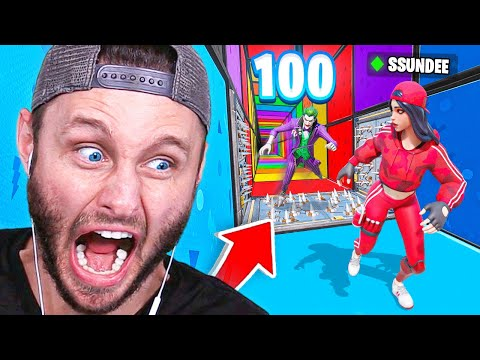

In [15]:
PIL.Image.open(thumbnail_data[0][0])

Load the data into `dataset`. It's unfortunately a mix of thumbnails and youtube shorts thumbnails which have a portrait orientation

In [16]:
import numpy as np
from PIL import Image



def load_and_preprocess_image(img_path, target_size=(64, 64)):
    # Open the image file
    img = Image.open(img_path)
    
    # Resize the image
    img = img.resize(target_size)
    
    # Convert the image to a numpy array
    img_array = np.array(img)
    
    # If it's a grayscale image, convert it to RGB
    if len(img_array.shape) == 2:
        img_array = np.repeat(img_array[:, :, np.newaxis], 3, axis=2)
    
    # Normalize from [0, 255] to [-1, 1]
    img_array = (img_array.astype('float32') - 127.5) / 127.5
    return img_array


data_subset = thumbnail_data

images = [load_and_preprocess_image(t[0]) for t in tqdm(data_subset)] 
# dataset = dataset * BATCH_SIZE
len(images)

100%|██████████| 7195/7195 [00:11<00:00, 622.67it/s]


7195

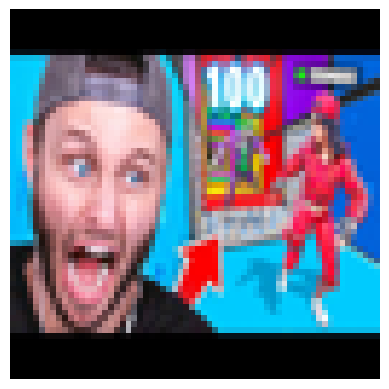

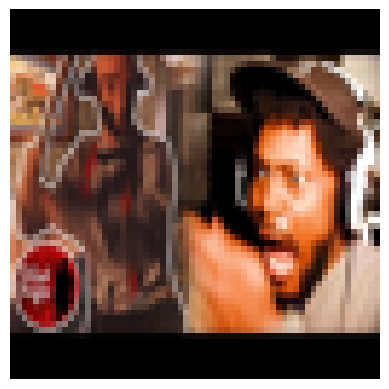

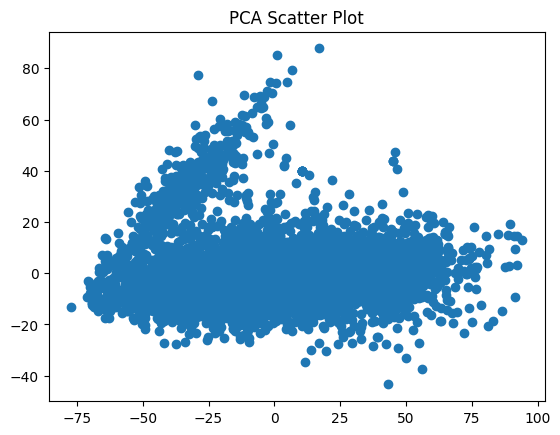

In [17]:
# Make sure the preprocessing worked
for image in images[:2]:
    visualize_preprocessed_image(image)

visualize_image_scatter(images)

Get rid of the shorts by removing everything in that smaller, higher cluster.

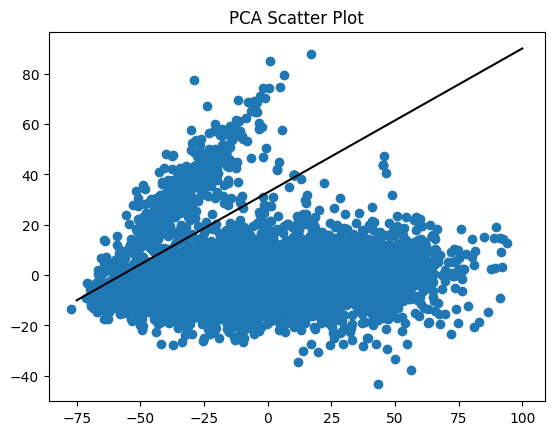

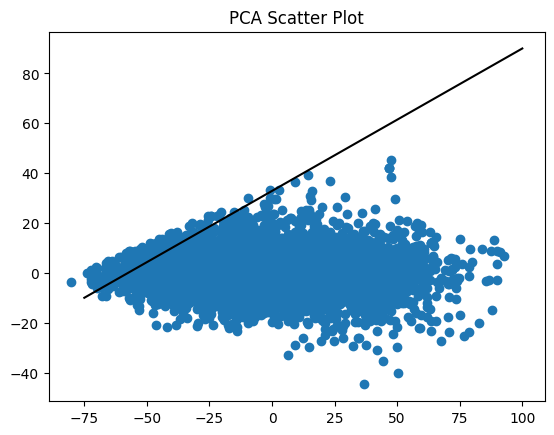

Left with 6719 thumbnails


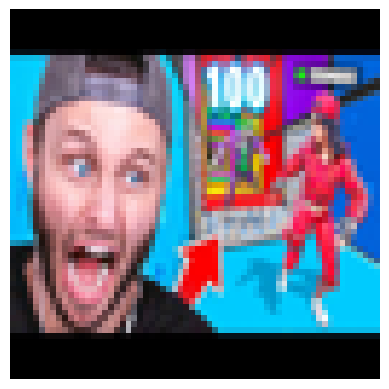

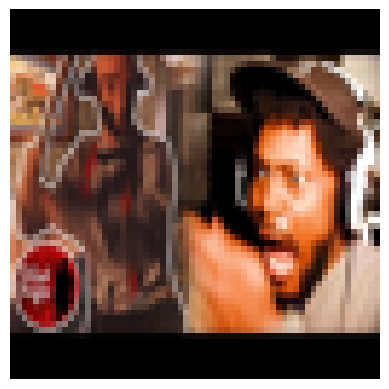

In [16]:
def is_above_line(point, line_point1, line_point2):
    (x, y) = point
    (x1, y1) = line_point1
    (x2, y2) = line_point2

    # Calculate the gradient (slope) of the line
    m = (y2 - y1) / (x2 - x1)

    # Calculate the y-intercept (c) of the line
    c = y1 - m * x1

    # Calculate the y-coordinate of the point on the line with the same x-coordinate
    line_y = m * x + c
    return y > line_y

def scatter(images):
    # Flatten each image into a 1D array
    flattened_images = np.array([img.flatten() for img in images])

    # Apply PCA with 2 components
    pca = PCA(2)
    reduced_data = pca.fit_transform(flattened_images)

    # Plot the reduced data as a scatter plot
    plt.scatter(reduced_data[:, 0], reduced_data[:, 1])
    plt.title('PCA Scatter Plot')
    plt.plot([-75, 100], [-10, 90], 'k-')
    plt.show()

def get_rid_of_shorts(dataset):
    pca = PCA(2)

    flattened_images = np.array([img.flatten() for img in dataset])
    pca.fit(flattened_images)

    pca_data= pca.transform(flattened_images)

    # # zip the reduced data with the original data
    # List of (pca, index, original)
    all_data = list(zip(pca_data, list(range(len(dataset))), dataset))

    no_shorts_thumbnail_data = [x for x in all_data if not is_above_line(x[0], [-75.0, -10.0 ], [100.0, 90.0])]

    scatter([x[0] for x in no_shorts_thumbnail_data])

    indexes_to_keep = [x[1] for x in no_shorts_thumbnail_data]
    filtered_dataset = [dataset[i] for i in indexes_to_keep]

    print(f'Left with {len(filtered_dataset )} thumbnails')
    visualize_preprocessed_image(filtered_dataset[0])
    visualize_preprocessed_image(filtered_dataset[1])
    return filtered_dataset

scatter(images)
no_shorts_dataset = get_rid_of_shorts(images)

# Train the model

In [17]:


generator = build_generator(latent_dim)
discriminator = build_discriminator()
gan = build_gan(generator, discriminator)
load_weights(gan)


Model: "Generator"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_3 (Dense)             (None, 128)               15488     
                                                                 
 leaky_re_lu_1 (LeakyReLU)   (None, 128)               0         
                                                                 
 dense_4 (Dense)             (None, 16384)             2113536   
                                                                 
 dropout_1 (Dropout)         (None, 16384)             0         
                                                                 
 reshape_1 (Reshape)         (None, 8, 8, 256)         0         
                                                                 
 conv2d_transpose_4 (Conv2DT  (None, 16, 16, 256)      590080    
 ranspose)                                                       
                                                         

Loaded previous weights


Epoch 0 | Similarity: -0.86075437 | Gen Loss: 10.78577042 | Disc Loss: 0.61513060 | Disc Real Loss: 0.37724191 | Disc Fake Loss: 0.23788874
1/1 [==============================] - 0s 493ms/step


<Figure size 640x480 with 0 Axes>

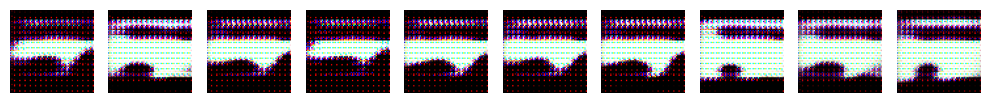

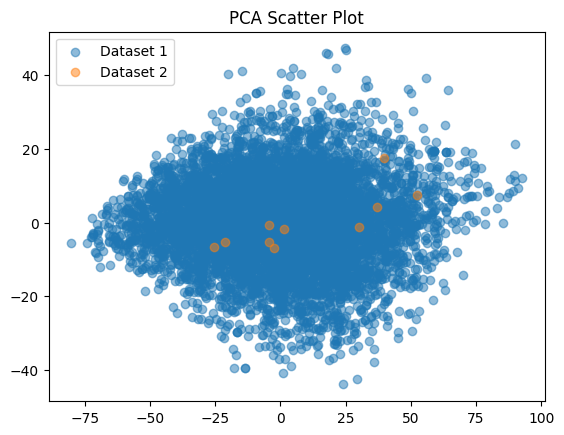

Epoch 1 | Similarity: 0.30238801 | Gen Loss: 1.20319450 | Disc Loss: 11.82598019 | Disc Real Loss: 0.45775786 | Disc Fake Loss: 11.36822224
1/1 [==============================] - 0s 18ms/step


<Figure size 640x480 with 0 Axes>

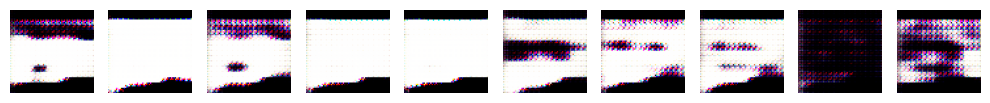

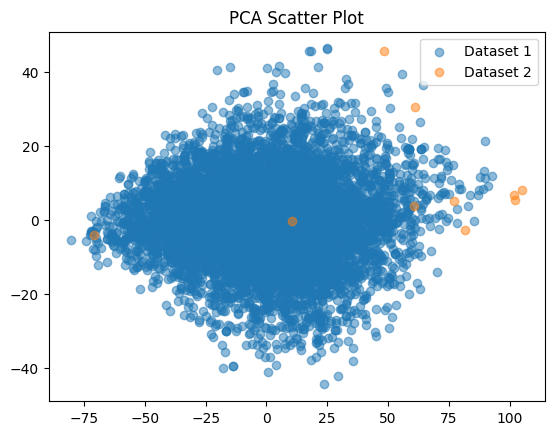

In [18]:
EPOCHS = 100000
# BATCH_SIZE = 120
# Train the GAN
train(no_shorts_dataset, EPOCHS, gan=gan, discriminator=discriminator, generator=generator, samples_after=2, discriminator_every=2, generator_every=1)


# Make some stuff


1/1 [==============================] - 0s 20ms/step


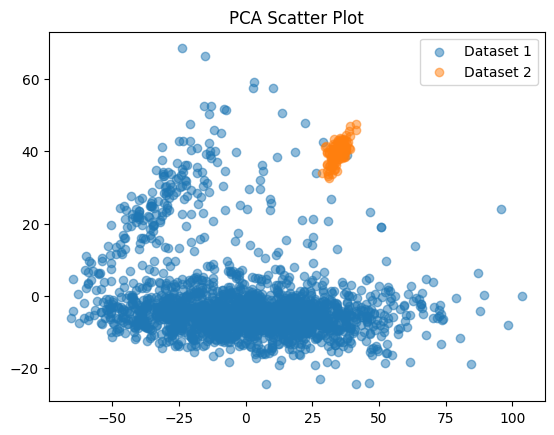

In [42]:
# visualize_image_scatter(dataset)
generated = [generator.predict(tf.random.normal([1, latent_dim])) for i in range(100)]
# visualize_image_scatter(generated )
compare_scatters(images, generated)


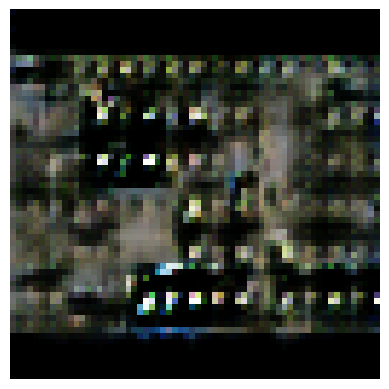

[None]

In [29]:

noise = np.random.uniform(.9, 1, size=(1, latent_dim))
generated_images = generator(noise, training=True)
generated_images 
[visualize_preprocessed_image(img) for img in generated_images]

In [40]:

noise = np.random.uniform(-1, 1, size=(100, latent_dim))
generated_images = generator(noise, training=True)
len(generated_images)

def create_batches(lst, batch_size):
    """Yield successive n-sized batches from lst."""
    for i in range(0, len(lst), batch_size):
        yield lst[i:i + batch_size]

batches = list(create_batches(generated_images, 1))
len(batches[0][0])


64